## Image Colorisation Using GAN

# The Problem

    Given a grayscale image with only one color channel, create a model which can convert it into its color correspondent RGB image.

In [1]:
import numpy as np 
import pandas as pd 
import os
from tqdm import tqdm_notebook as tqdm
from sklearn.preprocessing import LabelEncoder
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

from skimage.color import rgb2lab, lab2rgb

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import Dataset
import torchvision
import torchvision.transforms as transforms
'''for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))'''



"for dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))"

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print(device)

cuda:0


# Dataset

<span style="font-size:18px;">The dataset we chose to use is the [celebrity faces dataset](http://www.kaggle.com/datasets/jessicali9530/celeba-dataset).\ This dataset consists of 200,000+ images of celebrity faces, we used only 10,000 images for this project.\ Each image is an RGB image of size 218 * 178 pixels.<\span>

In [3]:
BASE_PATH = '../input/celeba-dataset/img_align_celeba/img_align_celeba/'

# Creating a dataframe for indexing images

image=[]
size=[]
count = 0

for c in os.listdir(BASE_PATH):
    if count < 10000:
        image.append(c)
        size.append(np.array(Image.open(os.path.join(BASE_PATH, c))).shape)
    else:
        break
    count += 1
    
data = {'Images':image, 'Size':size} 
data = pd.DataFrame(data) 
data.head()

,Images,Size
0,083648.jpg,"(218, 178, 3)"
1,168202.jpg,"(218, 178, 3)"
2,125778.jpg,"(218, 178, 3)"
3,059339.jpg,"(218, 178, 3)"
4,032501.jpg,"(218, 178, 3)"


In [4]:
batch_size = 16
validation_split = 0.2
shuffle_dataset = True
random_seed= 42

In [5]:
indices = list(range(len(data)))
split = int(np.floor(validation_split * len(data)))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_indices)
validation_sampler = SubsetRandomSampler(val_indices)

# Dataset Class

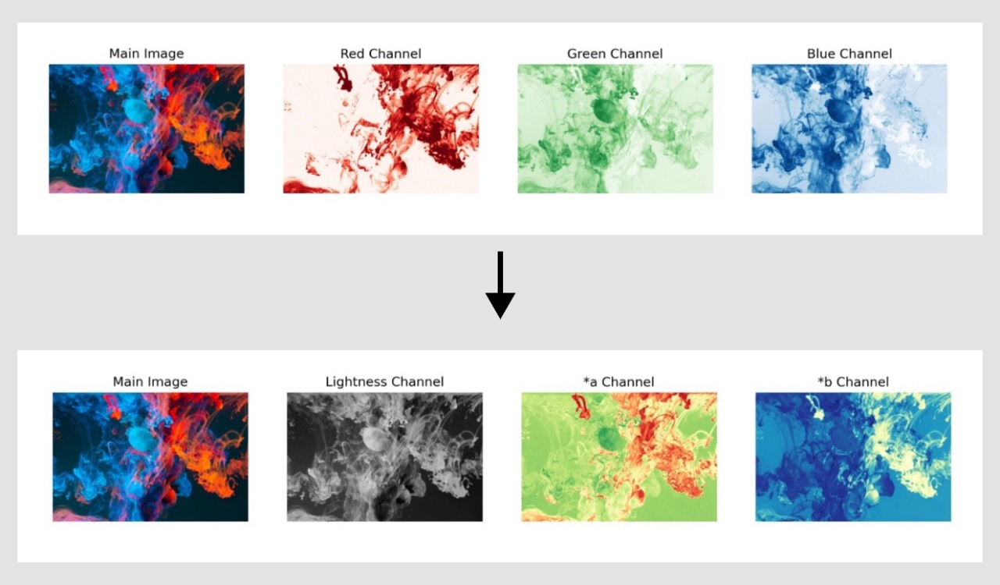<span style = "font-size:18px;">
    LAB is a color space just like RGB but here the 3 dimensions represent Lightness(L), Green-Redness (a) and Yellow-blueness (b) of each pixel<\span>

For the task of image colourisation it is better to use LAB colour space because 

<ul style = "font-size:18px;">
<li>The L channel can be straight away used as the grayscale input image.<\li>
<li>It is easier for the model to predict 2 numbers (output channels a & b only) as compared to predicting 3 channels (R,G,B) as there would be less number of possible combinations possible<\li>
<\ul>

In [6]:
class Image_Dataset(Dataset):
    def __init__(self,img_data, base_path, transform=None):
        self.img_data = img_data
        self.base_path = base_path
        self.transform = transform
        
    def __len__(self):
        return len(self.img_data)
    
    def __getitem__(self, index):
        img_name = os.path.join(self.base_path, self.img_data.loc[index, 'Images'])
        img = Image.open(img_name).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)
        img = np.array(img)
        
        rgb_img = transforms.ToTensor()(img)
        
        img_lab = rgb2lab(img).astype("float32")
        img_lab = transforms.ToTensor()(img_lab)

        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1

        return L, ab, rgb_img

In [7]:
dataset = Image_Dataset(data, BASE_PATH, transform = transforms.Resize((256, 256),  Image.BICUBIC))

train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=train_sampler)
validation_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=validation_sampler)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.

  """Entry point for launching an IPython kernel.

/opt/conda/lib/python3.7/site-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.

  "Argument interpolation should be of type InterpolationMode instead of int. "


In [8]:
def display_L_channel(L):
    L = (L+1.)*50.
    z = np.zeros((L.shape[1], L.shape[2], 3))
    z[:,:,0] = L[0,:,:]
    z = lab2rgb(z)
    return(z)

def display_rgb_img(img):
    img = img  # unnormalize
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))
    return npimg

# Displaying some training images

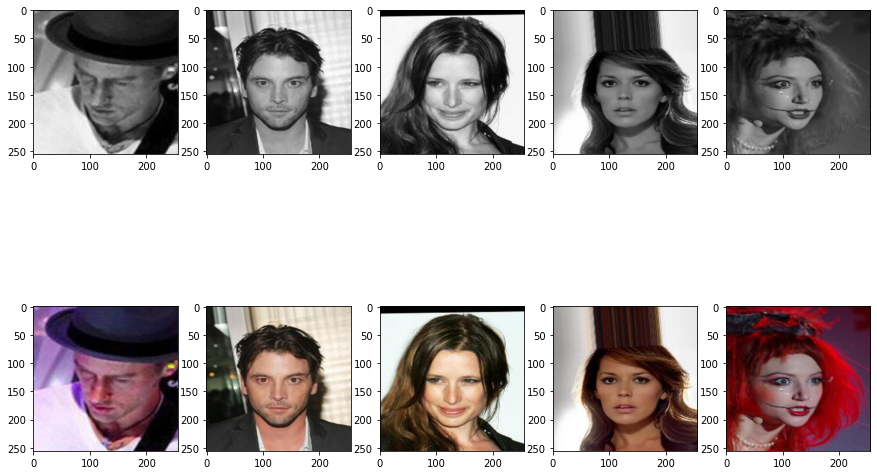

In [9]:
# get some random training images
dataiter = iter(train_loader)
lab_img_L, lab_img_ab, RGB_img = dataiter.next()

plt.figure(figsize=(15, 10))
for i in range(1, 6):
    with torch.no_grad():
        L = lab_img_L[i]
        ab = lab_img_ab[i]
        RGB = RGB_img[i]
        
        plt.subplot(2, 5, i)
        plt.imshow(display_L_channel(L)) 
        # plt.title(f"{i}")
        
        plt.subplot(2, 5, i + 5)
        plt.imshow(display_rgb_img(RGB)) 
        # plt.title(f"{i + 5}")

## GAN MODEL

<span style = "font-size: 18px;">Both the generator and the discriminator are neural networks. The generator output is connected directly to the discriminator input. The generator learns to generate plausible data and the discriminator learns to distinguish the generator's fake data from real data.
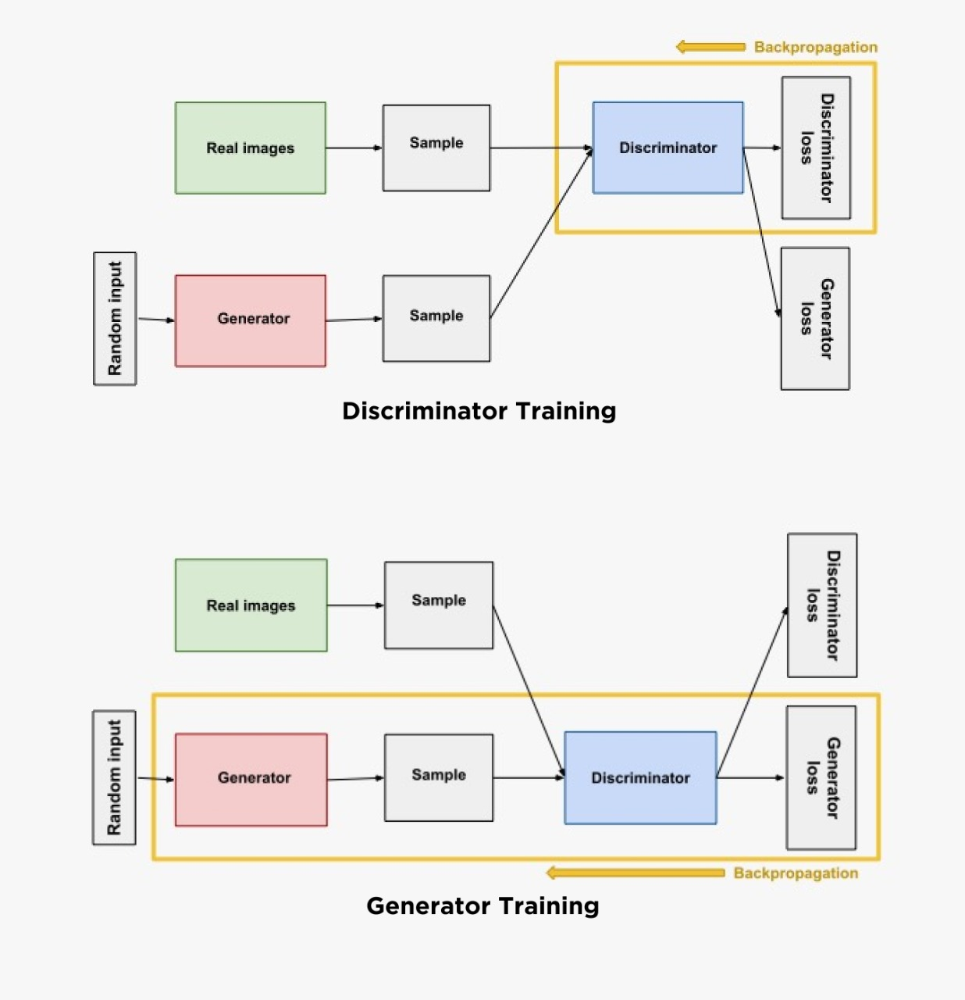
In the case of image colourisation we use a conditional GAN setup and provide additional information to the generator and discriminator models in the form of the grayscale image input.<\span>

# Generator

In [10]:
## Down Sampling Block
class down_block(nn.Module):
    def __init__(self, in_channels, out_channels, norm=True, act="leaky_relu", use_dropout=False):
        super(down_block, self).__init__()
        layers = []
        
        # Convolution Layers, output is approx half size due to stride = 2, didnt use MaxPooling here
        layers += [nn.Conv2d(in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias=False)]
        
        # BatchNorm, will be turned off for input down block
        if norm: layers += [nn.BatchNorm2d(out_channels)]
            
        # Two options for ReLU activation, LeakyReLU default for down block
        if act == "leaky_relu":  layers += [nn.LeakyReLU(0.2, inplace=True)]
        elif act == "relu": layers += [nn.ReLU(inplace=True)]
            
        if use_dropout: layers += [nn.Dropout(0.5)]
        
        self.conv = nn.Sequential(*layers)
        
        
    def forward(self, x):
        x = self.conv(x)
        return x
        
## Up sampling Block
        
class up_block(nn.Module):
    def __init__(self, in_channels, out_channels, norm=True, act="relu", use_dropout=False):
        super(up_block, self).__init__()
        layers = []
        
        # Two options for ReLU activation, LeakyReLU default for down block
        if act == "leaky_relu":  layers += [nn.LeakyReLU(0.2, inplace=True)]
        elif act == "relu": layers += [nn.ReLU(inplace=True)]
        
        # ConvTranspose2D 
        layers += [nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias=False)]
        
        # BatchNorm, will be turned off for output up block
        if norm: layers += [nn.BatchNorm2d(out_channels)]
            
        if use_dropout: layers += [nn.Dropout(0.5)]
            
        self.conv = nn.Sequential(*layers)
        
    def forward(self, x):
        x = self.conv(x)
        return x
        

In [11]:
class Unet(nn.Module):
    def __init__(self, in_channels=1, num_filters=64):
        super().__init__()
        # Down Sampling 
        self.input_down = down_block(in_channels = in_channels, out_channels = num_filters, norm=False) # norm=False for input down block
        
        self.down1 = down_block(in_channels = num_filters, out_channels = num_filters*2)
        self.down2 = down_block(in_channels = num_filters*2, out_channels = num_filters*4)
        self.down3 = down_block(in_channels = num_filters*4, out_channels = num_filters*8)
        
        self.down4 = down_block(in_channels = num_filters*8, out_channels = num_filters*8)
        self.down5 = down_block(in_channels = num_filters*8, out_channels = num_filters*8)
        self.down6 = down_block(in_channels = num_filters*8, out_channels = num_filters*8)
        
        # Bottleneck 
        
        self.bottleneck = nn.Sequential(
            nn.Conv2d(in_channels = num_filters*8, out_channels = num_filters*8, kernel_size = 4, stride = 2, padding = 1, bias=False),
            up_block(in_channels = num_filters*8, out_channels = num_filters*8)
        )
        
        # Up Sampling
        
        self.up1 = up_block(in_channels = num_filters*8*2, out_channels = num_filters*8, use_dropout=True)
        self.up2 = up_block(in_channels = num_filters*8*2, out_channels = num_filters*8, use_dropout=True)
        self.up3 = up_block(in_channels = num_filters*8*2, out_channels = num_filters*8, use_dropout=True)
        
        self.up4 = up_block(in_channels = num_filters*8*2, out_channels = num_filters*4)
        self.up5 = up_block(in_channels = num_filters*4*2, out_channels = num_filters*2)
        self.up6 = up_block(in_channels = num_filters*2*2, out_channels = num_filters)
        
        self.output_up = nn.Sequential(
            up_block(in_channels = num_filters*2, out_channels = in_channels*2, norm=False), 
            nn.Tanh()
        )
        
    def forward(self, x):
        d1 = self.input_down(x)
        d2 = self.down1(d1)
        d3 = self.down2(d2)
        d4 = self.down3(d3)
        d5 = self.down4(d4)
        d6 = self.down5(d5)
        d7 = self.down6(d6)
        bottleneck = self.bottleneck(d7)
        up1 = self.up1(torch.cat([bottleneck, d7], 1))
        up2 = self.up2(torch.cat([up1, d6], 1))
        up3 = self.up3(torch.cat([up2, d5], 1))
        up4 = self.up4(torch.cat([up3, d4], 1))
        up5 = self.up5(torch.cat([up4, d3], 1))
        up6 = self.up6(torch.cat([up5, d2], 1))
        output = self.output_up(torch.cat([up6, d1], 1))
        
        return output

# Patch Discriminator

In [12]:
class PatchDiscriminator(nn.Module):
    def __init__(self, in_channels, num_filters = 64, n_middle = 3):
        super().__init__()
        layers = []
        layers.append(nn.Conv2d(in_channels, num_filters,4, 2, 1, bias = True))
        layers.append(nn.LeakyReLU(0.2, True))

        for i in range(n_middle):
            layers.append(nn.Conv2d(num_filters * 2 ** i, num_filters * 2 ** (i+1), 4, stride = 1 if i == (n_middle - 1) else 2, padding = 1, bias = False))
            layers.append(nn.BatchNorm2d(num_filters * 2 ** (i+1)))
            layers.append(nn.LeakyReLU(0.2, True))
                                 
        layers.append(nn.Conv2d(num_filters * 2 ** n_middle, 1, 4, 1 ,1, bias = True))

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

# Loss Function

In [13]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
#         self.real_label = torch.tensor(real_label)
#         self.fake_label = torch.tensor(fake_label)
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

# Initialisation of weights for the model

In [14]:
def init_weights(net, init='norm', gain=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

# Main Model

In [15]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        
        if net_G is None:
            self.net_G = init_model(Unet(in_channels=1, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(in_channels=3, num_filters = 64, n_middle = 3), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        L, ab, rgb_img = data
        self.L = L.to(self.device)
        self.ab = ab.to(self.device)
        
    def forward(self):
        self.fake_color = self.net_G(self.L)
    
    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

# Utility Functions

In [16]:
class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

# Training the Model

model initialized with norm initialization

model initialized with norm initialization


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0

Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`

  import sys


  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 1/30

Iteration 400/500

loss_D_fake: 0.53250

loss_D_real: 0.57474

loss_D: 0.55362

loss_G_GAN: 1.32577

loss_G_L1: 7.40867

loss_G: 8.73444


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 1 pixels

  return func(*args, **kwargs)


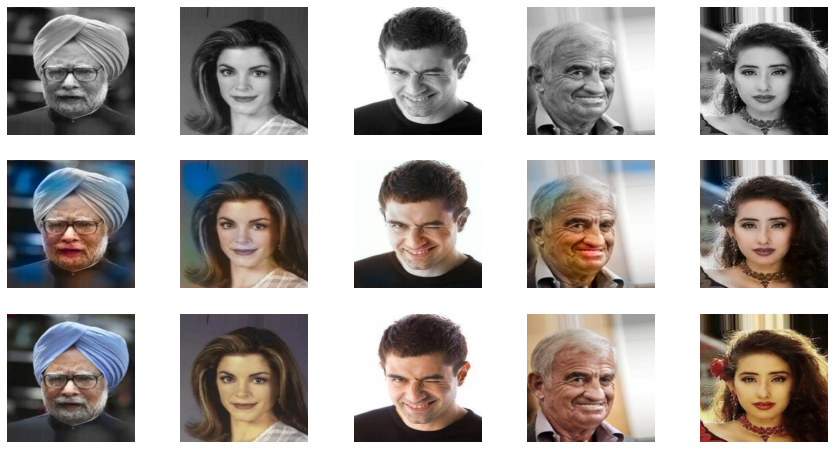

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 2/30

Iteration 400/500

loss_D_fake: 0.55414

loss_D_real: 0.58862

loss_D: 0.57138

loss_G_GAN: 1.18469

loss_G_L1: 7.38287

loss_G: 8.56756


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 2 pixels

  return func(*args, **kwargs)


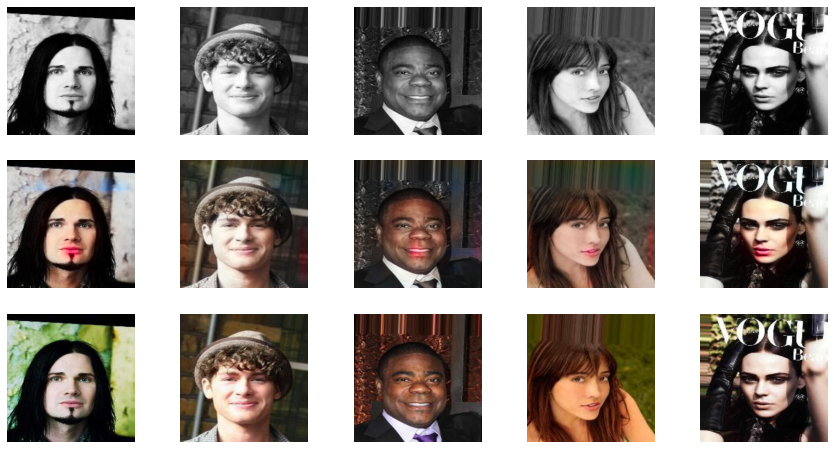

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 3/30

Iteration 400/500

loss_D_fake: 0.55000

loss_D_real: 0.58983

loss_D: 0.56992

loss_G_GAN: 1.18486

loss_G_L1: 7.45416

loss_G: 8.63901


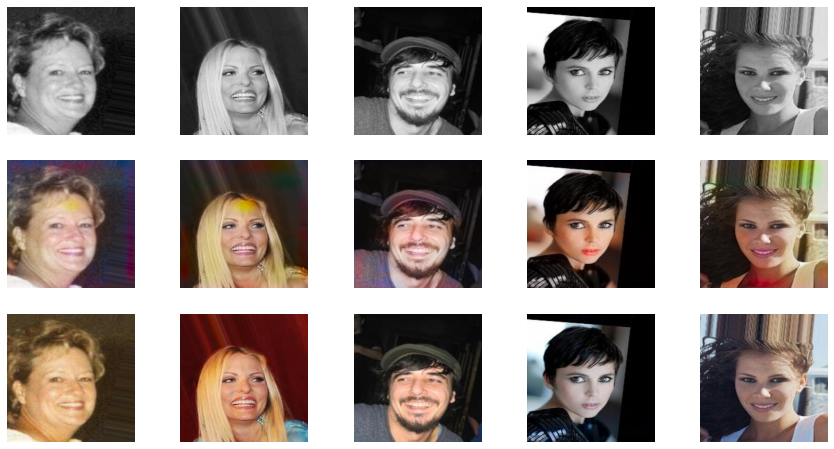

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 4/30

Iteration 400/500

loss_D_fake: 0.55859

loss_D_real: 0.60336

loss_D: 0.58097

loss_G_GAN: 1.14027

loss_G_L1: 7.39555

loss_G: 8.53582


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 13 pixels

  return func(*args, **kwargs)

/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 107 pixels

  return func(*args, **kwargs)

/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 966 pixels

  return func(*args, **kwargs)

/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 41 pixels

  return func(*args, **kwargs)


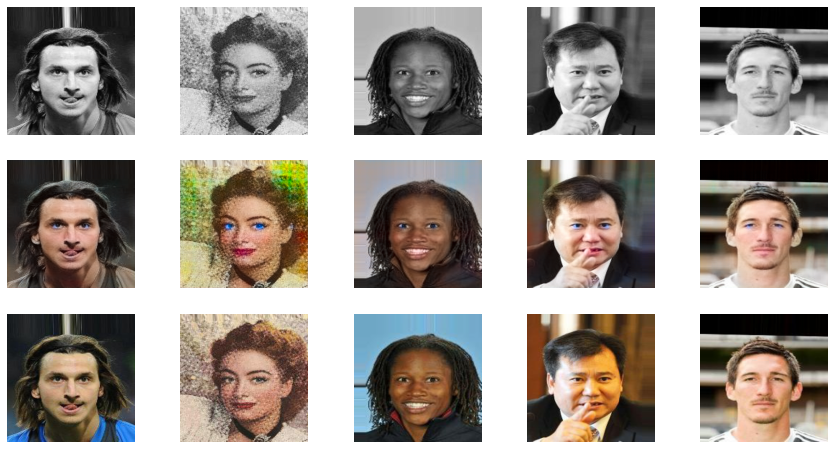

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 5/30

Iteration 400/500

loss_D_fake: 0.55427

loss_D_real: 0.60329

loss_D: 0.57878

loss_G_GAN: 1.14684

loss_G_L1: 7.43130

loss_G: 8.57814


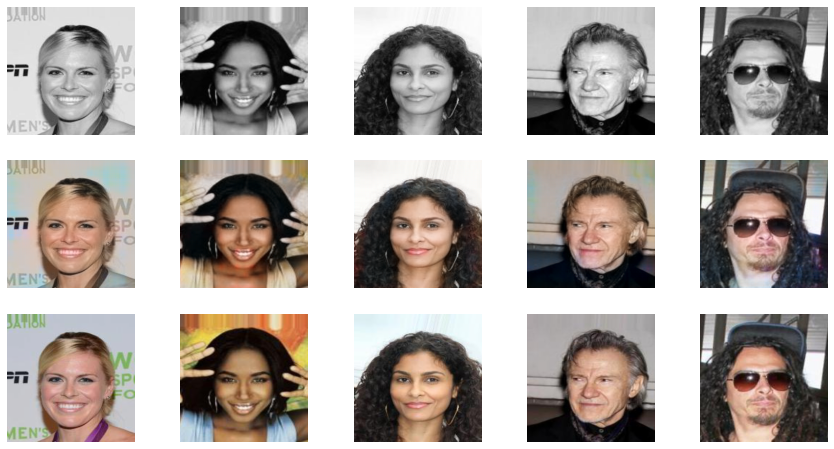

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 6/30

Iteration 400/500

loss_D_fake: 0.55961

loss_D_real: 0.60786

loss_D: 0.58373

loss_G_GAN: 1.12095

loss_G_L1: 7.27012

loss_G: 8.39107


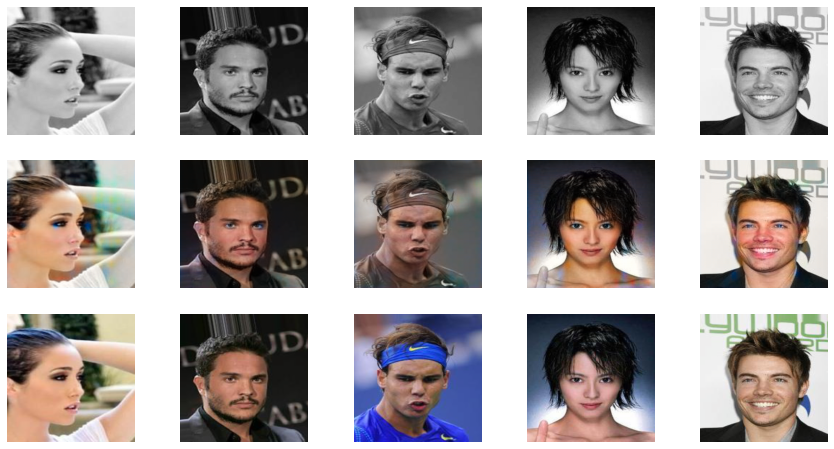

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 7/30

Iteration 400/500

loss_D_fake: 0.56850

loss_D_real: 0.61479

loss_D: 0.59165

loss_G_GAN: 1.09664

loss_G_L1: 7.20894

loss_G: 8.30558


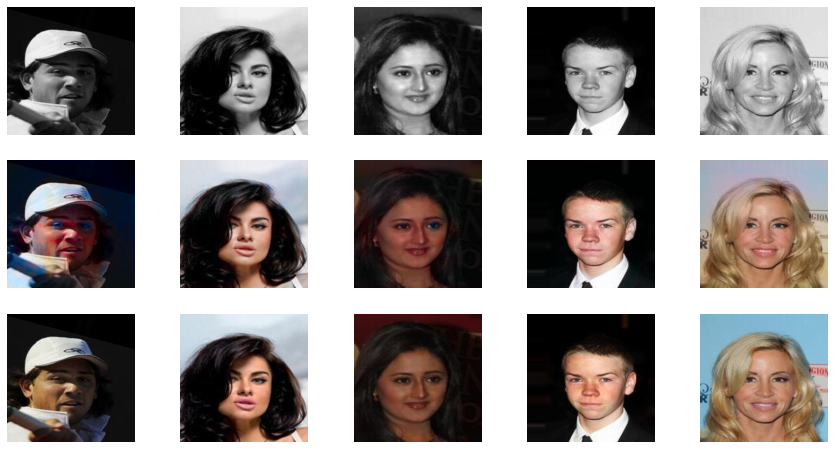

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 8/30

Iteration 400/500

loss_D_fake: 0.56732

loss_D_real: 0.62624

loss_D: 0.59678

loss_G_GAN: 1.08320

loss_G_L1: 7.17873

loss_G: 8.26192


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 3 pixels

  return func(*args, **kwargs)


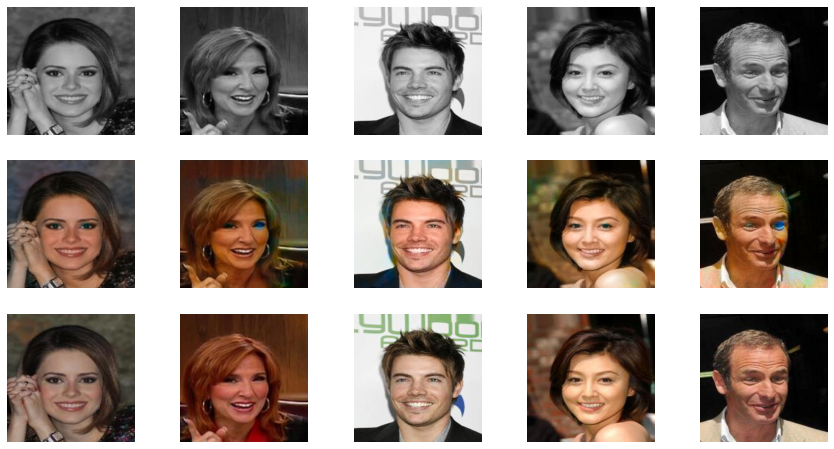

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 9/30

Iteration 400/500

loss_D_fake: 0.57451

loss_D_real: 0.62642

loss_D: 0.60047

loss_G_GAN: 1.06441

loss_G_L1: 7.04255

loss_G: 8.10696


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 65 pixels

  return func(*args, **kwargs)

/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 29 pixels

  return func(*args, **kwargs)


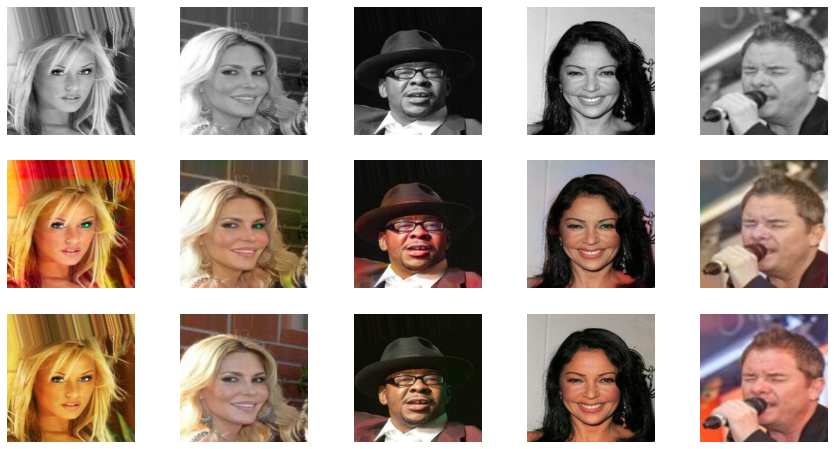

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 10/30

Iteration 400/500

loss_D_fake: 0.57707

loss_D_real: 0.63069

loss_D: 0.60388

loss_G_GAN: 1.04472

loss_G_L1: 6.88587

loss_G: 7.93059


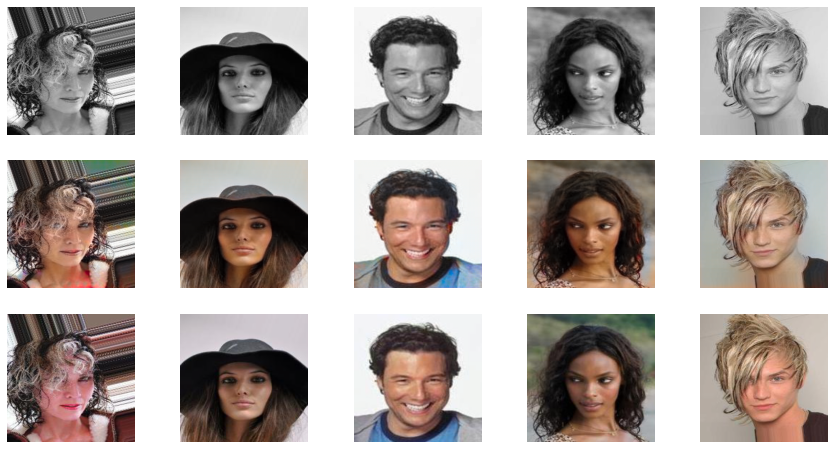

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 11/30

Iteration 400/500

loss_D_fake: 0.58521

loss_D_real: 0.62737

loss_D: 0.60629

loss_G_GAN: 1.03590

loss_G_L1: 6.74215

loss_G: 7.77806


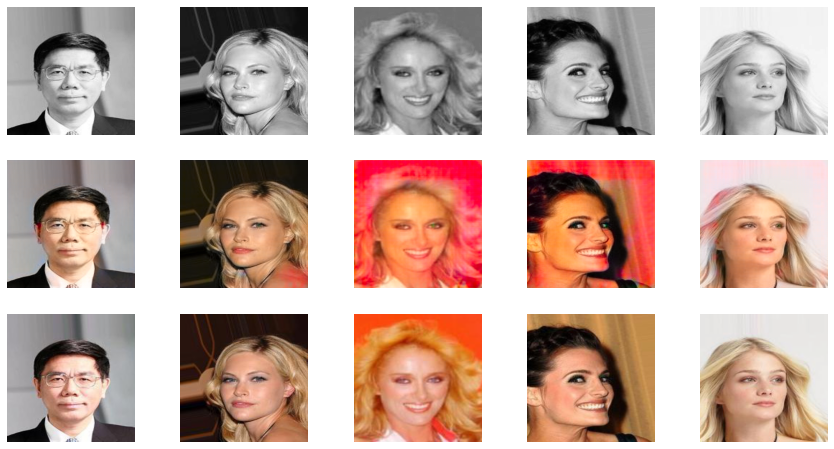

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 12/30

Iteration 400/500

loss_D_fake: 0.57665

loss_D_real: 0.62757

loss_D: 0.60211

loss_G_GAN: 1.02762

loss_G_L1: 6.48802

loss_G: 7.51564


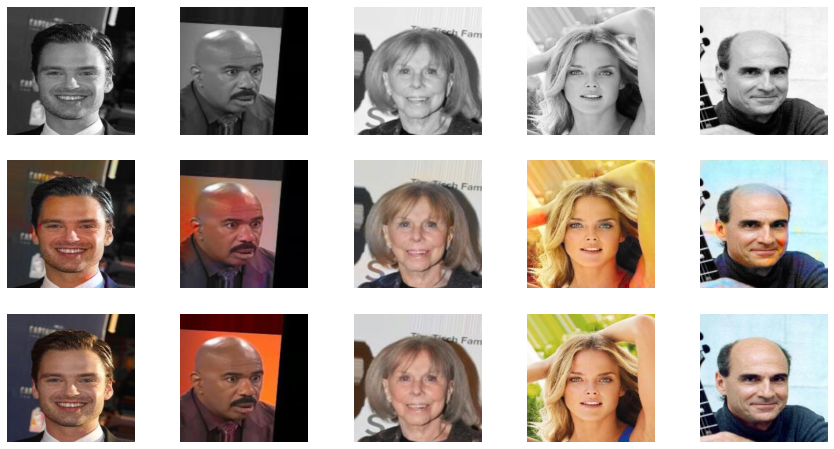

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 13/30

Iteration 400/500

loss_D_fake: 0.59672

loss_D_real: 0.64016

loss_D: 0.61844

loss_G_GAN: 0.99758

loss_G_L1: 6.31547

loss_G: 7.31305


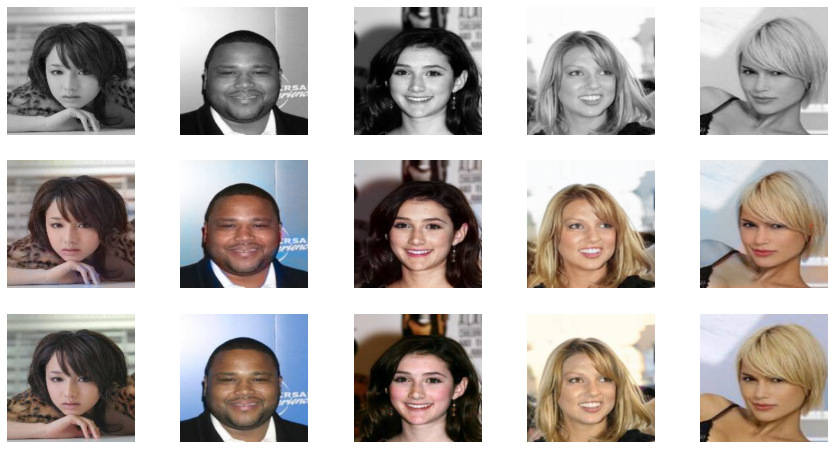

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 14/30

Iteration 400/500

loss_D_fake: 0.59306

loss_D_real: 0.63244

loss_D: 0.61275

loss_G_GAN: 0.98686

loss_G_L1: 6.08900

loss_G: 7.07586


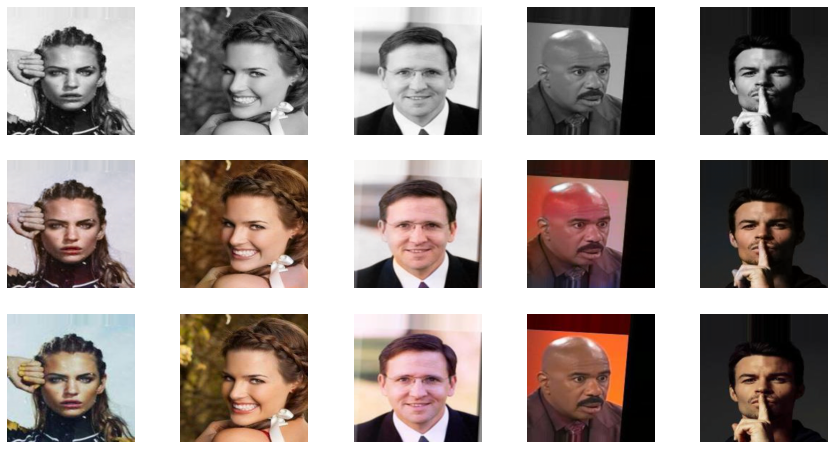

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 15/30

Iteration 400/500

loss_D_fake: 0.59595

loss_D_real: 0.63826

loss_D: 0.61711

loss_G_GAN: 0.97714

loss_G_L1: 5.89929

loss_G: 6.87643


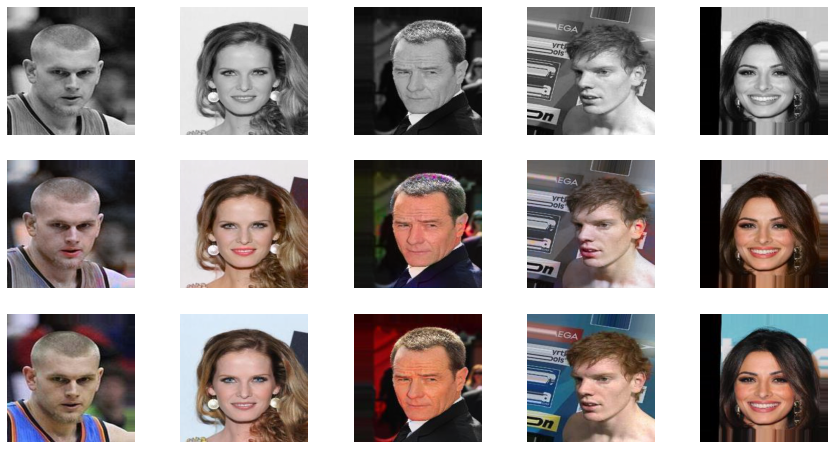

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 16/30

Iteration 400/500

loss_D_fake: 0.60406

loss_D_real: 0.63894

loss_D: 0.62150

loss_G_GAN: 0.96163

loss_G_L1: 5.72106

loss_G: 6.68269


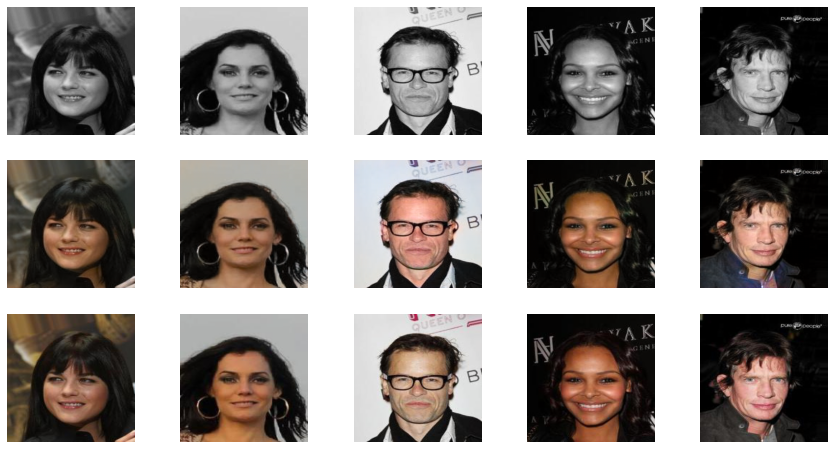

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 17/30

Iteration 400/500

loss_D_fake: 0.60681

loss_D_real: 0.63773

loss_D: 0.62227

loss_G_GAN: 0.96236

loss_G_L1: 5.50216

loss_G: 6.46452


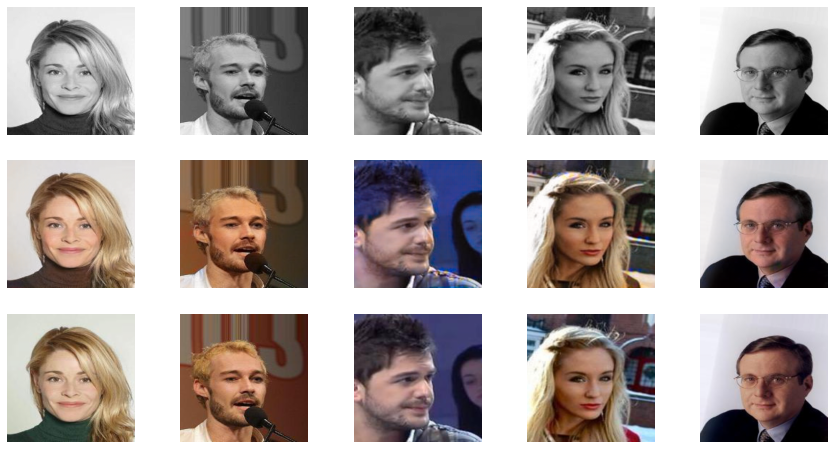

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 18/30

Iteration 400/500

loss_D_fake: 0.60778

loss_D_real: 0.63721

loss_D: 0.62250

loss_G_GAN: 0.95074

loss_G_L1: 5.33613

loss_G: 6.28687


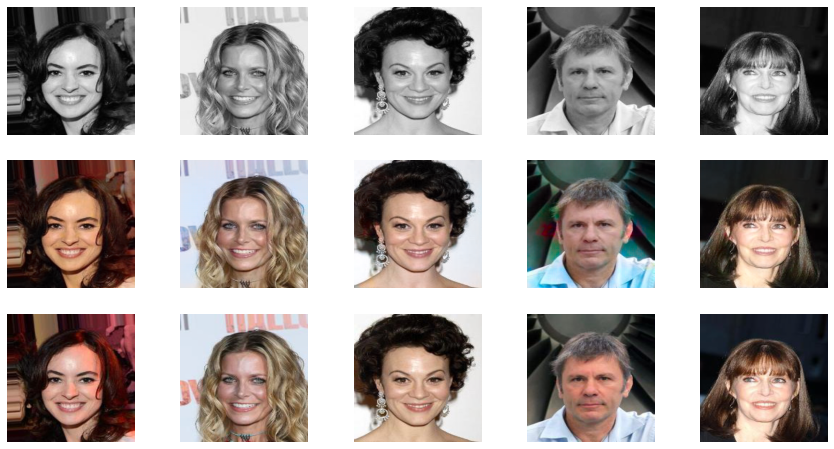

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 19/30

Iteration 400/500

loss_D_fake: 0.61569

loss_D_real: 0.63820

loss_D: 0.62695

loss_G_GAN: 0.93286

loss_G_L1: 5.23038

loss_G: 6.16324


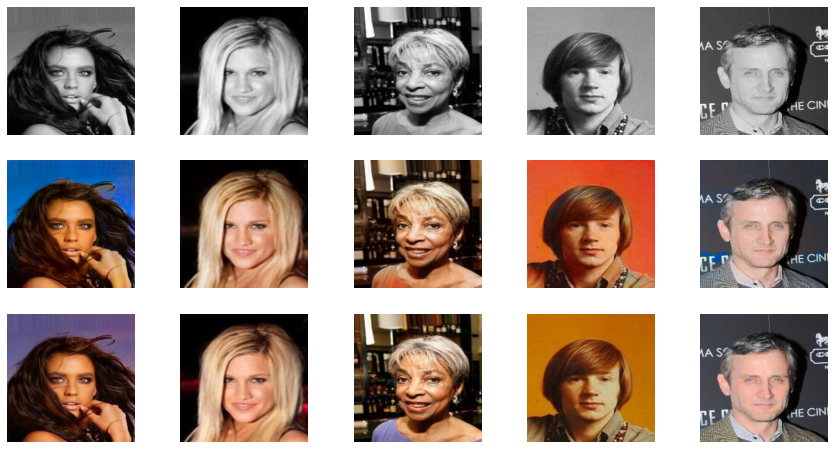

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 20/30

Iteration 400/500

loss_D_fake: 0.61480

loss_D_real: 0.64079

loss_D: 0.62779

loss_G_GAN: 0.93378

loss_G_L1: 5.00935

loss_G: 5.94313


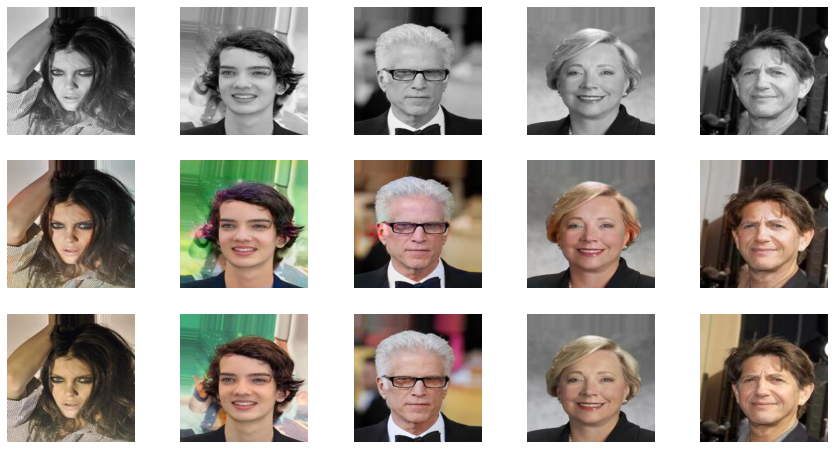

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 21/30

Iteration 400/500

loss_D_fake: 0.61665

loss_D_real: 0.63833

loss_D: 0.62749

loss_G_GAN: 0.92571

loss_G_L1: 4.89369

loss_G: 5.81940


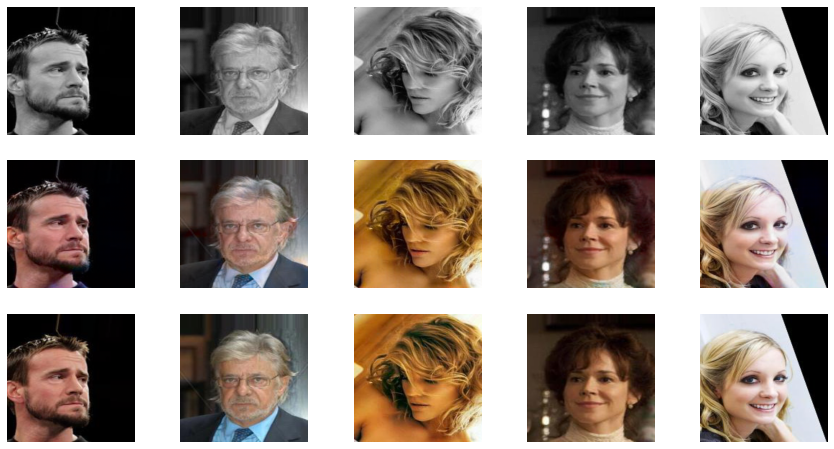

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 22/30

Iteration 400/500

loss_D_fake: 0.62154

loss_D_real: 0.64005

loss_D: 0.63080

loss_G_GAN: 0.92606

loss_G_L1: 4.77975

loss_G: 5.70581


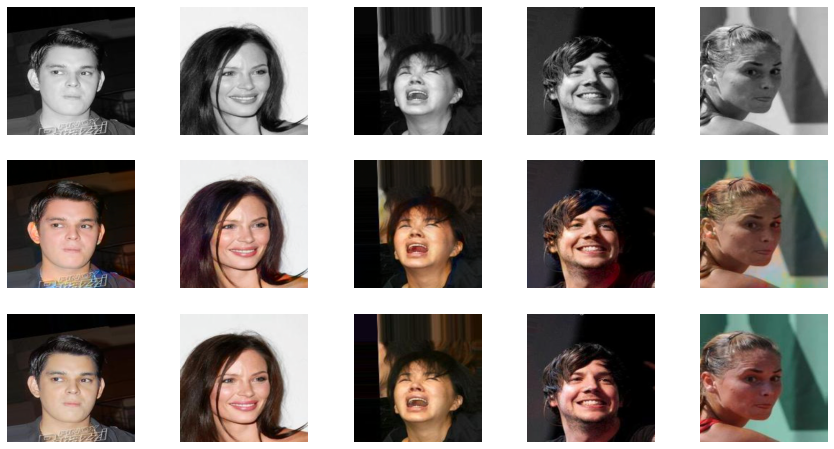

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 23/30

Iteration 400/500

loss_D_fake: 0.62059

loss_D_real: 0.64110

loss_D: 0.63084

loss_G_GAN: 0.92669

loss_G_L1: 4.66267

loss_G: 5.58936


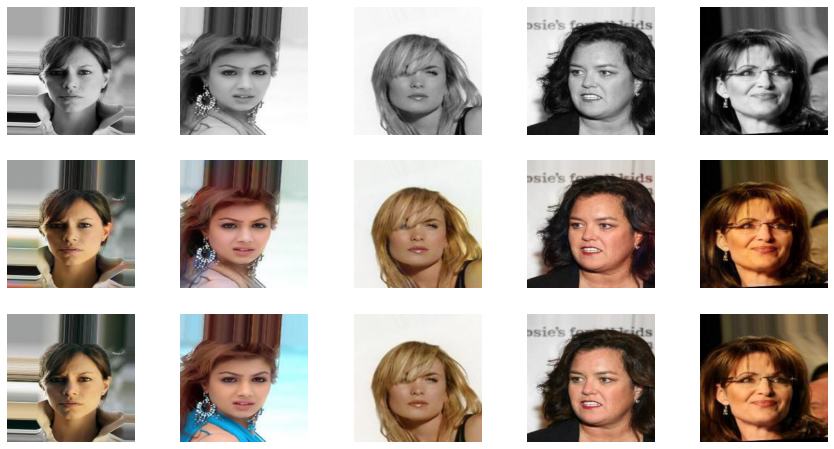

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 24/30

Iteration 400/500

loss_D_fake: 0.61889

loss_D_real: 0.63736

loss_D: 0.62812

loss_G_GAN: 0.92016

loss_G_L1: 4.53416

loss_G: 5.45432


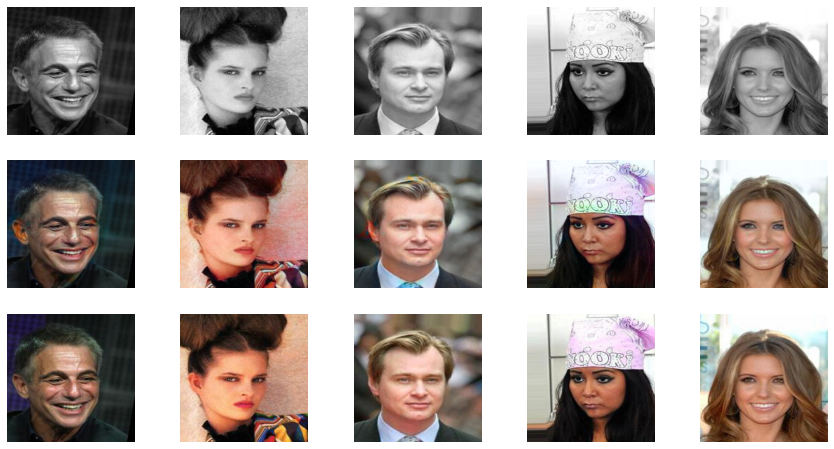

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 25/30

Iteration 400/500

loss_D_fake: 0.62708

loss_D_real: 0.64104

loss_D: 0.63406

loss_G_GAN: 0.91307

loss_G_L1: 4.44739

loss_G: 5.36046


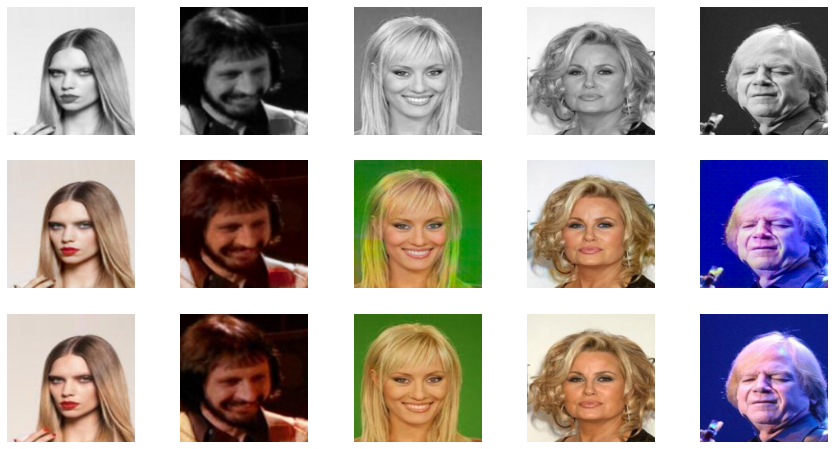

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 26/30

Iteration 400/500

loss_D_fake: 0.62400

loss_D_real: 0.63849

loss_D: 0.63125

loss_G_GAN: 0.90958

loss_G_L1: 4.37836

loss_G: 5.28794


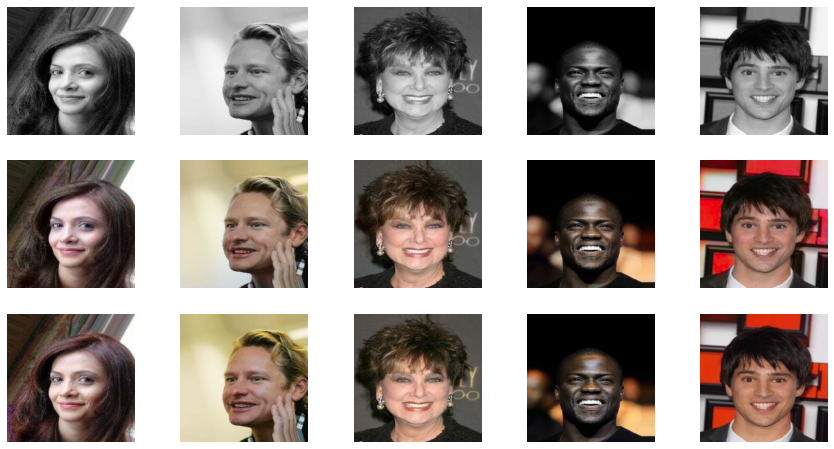

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 27/30

Iteration 400/500

loss_D_fake: 0.62405

loss_D_real: 0.63739

loss_D: 0.63072

loss_G_GAN: 0.92724

loss_G_L1: 4.28334

loss_G: 5.21058


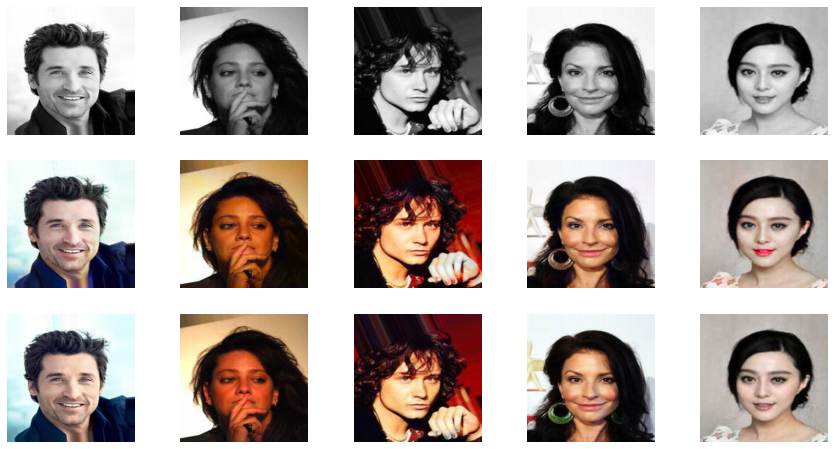

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 28/30

Iteration 400/500

loss_D_fake: 0.62152

loss_D_real: 0.63624

loss_D: 0.62888

loss_G_GAN: 0.92219

loss_G_L1: 4.22421

loss_G: 5.14639


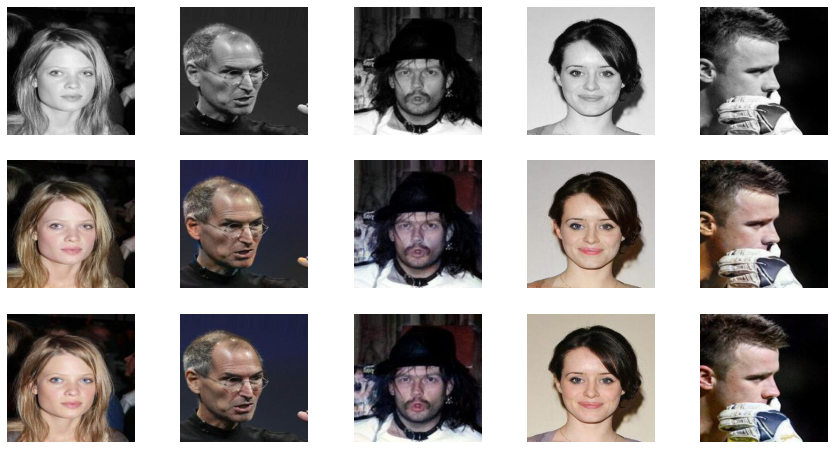

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 29/30

Iteration 400/500

loss_D_fake: 0.62259

loss_D_real: 0.63405

loss_D: 0.62832

loss_G_GAN: 0.91874

loss_G_L1: 4.15875

loss_G: 5.07748


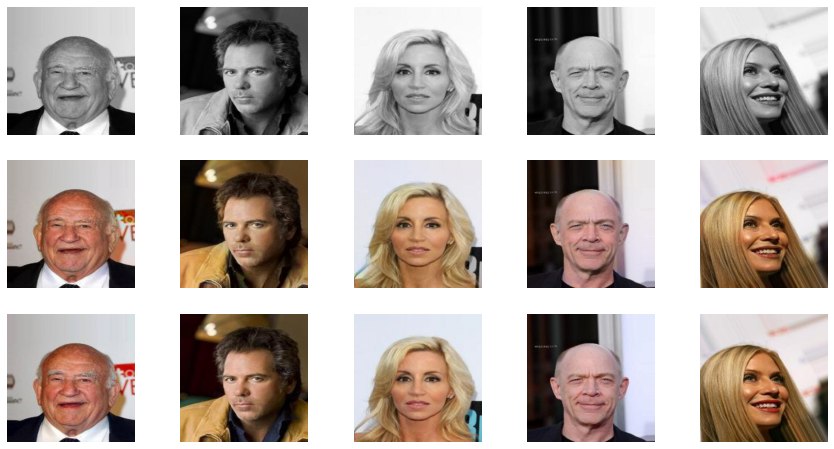

  0%|          | 0/500 [00:00<?, ?it/s]



Epoch 30/30

Iteration 400/500

loss_D_fake: 0.62596

loss_D_real: 0.63709

loss_D: 0.63152

loss_G_GAN: 0.92787

loss_G_L1: 4.07427

loss_G: 5.00214


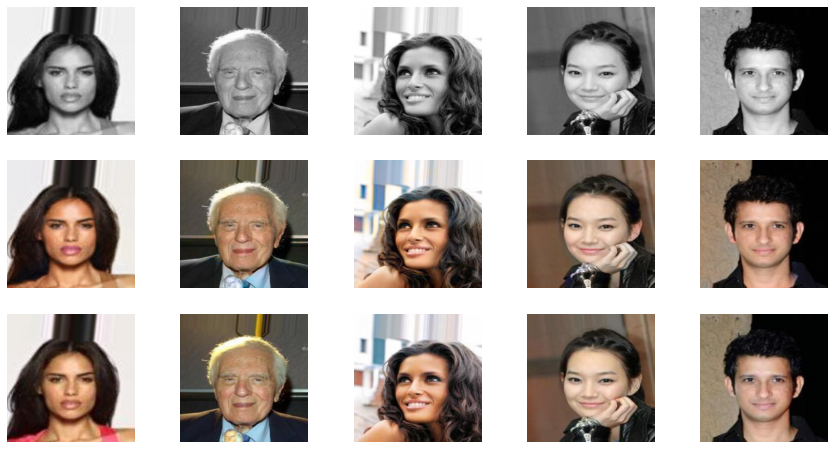

In [17]:
def train_model(model, train_loader, epochs, display_every=400):
    data = next(iter(validation_loader)) # getting a batch for visualizing the model output after fixed intrvals
    L, ab, rgb_img = data
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to 
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_loader):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=L.size(0)) # function updating the log objects
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_loader)}")
                log_results(loss_meter_dict) # function to print out the losses
                visualize(model, data, save=False) # function displaying the model's outputs
        if (e+1) % 5 == 0:
            torch.save(model.state_dict(), "main_model_epoch_" + str(e) + ".pth")

model = MainModel()
train_model(model, train_loader, 30)

In [18]:
# path = ""
# img = Image.open(path)
# img = img.resize((256, 256))
# img = transforms.ToTensor()(img)[:1] * 2. - 1.
# model.eval()
# with torch.no_grad():
#     preds = model.net_G(img.unsqueeze(0).to(device))
#     gen_output = lab_to_rgb(img.unsqueeze(0), preds.cpu())[0]
    
# plt.figure(figsize=(12,5))    
# plt.subplot(1,2,1)
# plt.imshow(display_L_channel(img))
# plt.subplot(1,2,2)
# plt.imshow(gen_output)
# plt.show()

# Result on Test Data

model initialized with norm initialization

model initialized with norm initialization


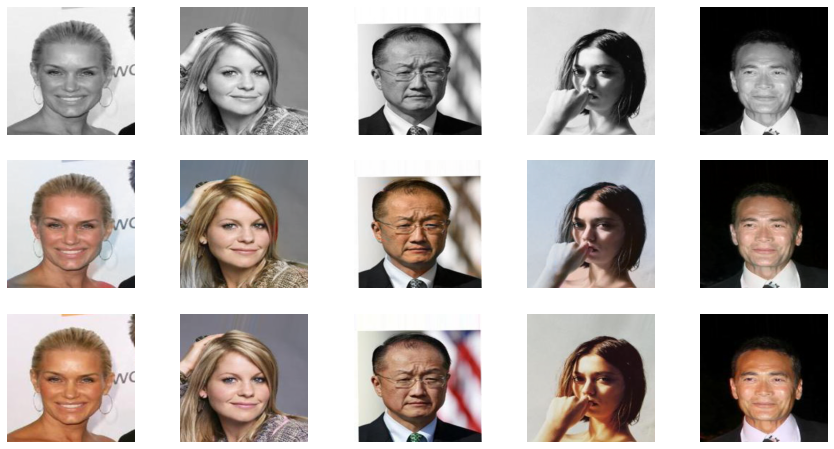

In [19]:
model = MainModel()
model.load_state_dict(torch.load('../input/model-for-img-colorization/main-model.pt'))

dataiter = iter(validation_loader)
data = dataiter.next()
visualize(model, data, save=False)